Some important information before starting Exploratory Data Analysis (EDA):
1. NYC is divided into 5 boroughs
2. Schools in NYC are grouped into school districts
3. Some of the schools are not high schools and are not relevant to SAT. This implies data pre-processing
4. Each school in NYC has a DBN which stands for District Borough Number, a unique code

First, we import NYC Data corresponding to:
1. AP_2010 : Advanced Placement Results for each high school
2. Class_size : class information for each school in NYC
3. Demographics : demographics for each school
4. Graduation: Percentage of students who graduated and associated information
5. Math Test Results : Math Test Results for every school in NYC
6. SAT Results : SAT Scores for every high school in NYC

Start by reading each file into pandas dataframe and store it in a dictionary.

In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

files = ["ap_2010.csv", "class_size.csv", "demographics.csv", "graduation.csv", "hs_directory.csv",
         "math_test_results.csv", "sat_results.csv"]

data = {}

for f in files:
    d = pd.read_csv("schools/{0}".format(f))
    data[f.replace(".csv", "")] = d

 We can observe the first five rows of each dataframe using the pandas method head()

In [2]:
for k,v in data.items():
    print("\n" + k + "\n")
    print(v.head())


ap_2010

      DBN                             SchoolName AP Test Takers   \
0  01M448           UNIVERSITY NEIGHBORHOOD H.S.              39   
1  01M450                 EAST SIDE COMMUNITY HS              19   
2  01M515                    LOWER EASTSIDE PREP              24   
3  01M539         NEW EXPLORATIONS SCI,TECH,MATH             255   
4  02M296  High School of Hospitality Management               s   

  Total Exams Taken Number of Exams with scores 3 4 or 5  
0                49                                   10  
1                21                                    s  
2                26                                   24  
3               377                                  191  
4                 s                                    s  

class_size

   CSD BOROUGH SCHOOL CODE                SCHOOL NAME GRADE  PROGRAM TYPE  \
0    1       M        M015  P.S. 015 Roberto Clemente     0K       GEN ED   
1    1       M        M015  P.S. 015 Roberto Clemente     0K

1. Most dataframes contain DBN column
2. Some dataframes contain Location column that maybe can be used to map information
3. Some dataframes have repeated DBN corresponding to different classes of that school

It is ideal to combine all dataframes into a single one for better handling.
DBN seems like a column upon which combination can be done.
1. hs_directory has dbn that can be renamed to DBN
2. class_size does not have DBN column - might require some pre-processing.

Let us carry out the above two actions

In [3]:
# Looking at class_size columns: It is clear that a combination of CSD and School Code will give DBN
data['class_size'].head()

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN


In [4]:
# CSD and School Code are combined to give DBN
data['class_size']['DBN'] = data['class_size'].apply(lambda x: "{0:02d}{1}".format(x["CSD"], x["SCHOOL CODE"]), axis=1)

In [5]:
# Rename the column dbn to DBN in hs_directory
data["hs_directory"]["DBN"] = data["hs_directory"]["dbn"]

We can also look at datasets of student, parent and teacher surveys. These will give us information on quality and safety of schools and even more. Let us add these datasets to data directory. There are two survey datasets:
1. survey_all.csv for all schools
2. survey_d75.csv for schools in school district 75

We can combine these two surveys into one dataframe (using concat method of pandas, axis = 0 tells pandas to concatenate row wise) and to differentiate the two can include a column which specifies which survey that row corresponds to.

In [6]:
survey1 = pd.read_csv('schools/survey_all.csv')
survey2 = pd.read_csv('schools/survey_d75.csv')
survey1.d75 = False
survey2.d75 = True
survey = pd.concat([survey1, survey2], axis = 0)

In [7]:
# A survey.head() reveals that there are too many columns. 
survey.head()

N_p    N_s   N_t  aca_p_11  aca_s_11  aca_t_11  aca_tot_11  com_p_11  \
0   90.0    NaN  22.0       7.8       NaN       7.9         7.9       7.6   
1  161.0    NaN  34.0       7.8       NaN       9.1         8.4       7.6   
2  367.0    NaN  42.0       8.6       NaN       7.5         8.0       8.3   
3  151.0  145.0  29.0       8.5       7.4       7.8         7.9       8.2   
4   90.0    NaN  23.0       7.9       NaN       8.1         8.0       7.9   

   com_s_11  com_t_11  com_tot_11     dbn  eng_p_11  eng_s_11  eng_t_11  \
0       NaN       7.8         7.7  01M015       7.5       NaN       7.6   
1       NaN       8.5         8.1  01M019       7.6       NaN       8.9   
2       NaN       6.3         7.3  01M020       8.3       NaN       6.8   
3       5.9       6.2         6.7  01M034       8.0       6.5       6.8   
4       NaN       7.3         7.6  01M063       8.1       NaN       7.8   

   eng_tot_11  nr_p  nr_s  nr_t  p_N_q10a  p_N_q10a_1  p_N_q10a_2  p_N_q10a_3  \
0         7.5   150     0    25      56.0         NaN         NaN         NaN   
1         8.2   269     0    33      76.0         NaN         NaN         NaN   
2         7.5   505     0    48     176.0         NaN         NaN         NaN   
3         7.1   301   163    40      95.0         NaN         NaN         NaN   
4         7.9   151     0    23      45.0         NaN         NaN         NaN   

   p_N_q10a_4  p_N_q10a_5  p_N_q10b  p_N_q10b_1  p_N_q10b_2  p_N_q10b_3  \
0         NaN         NaN      30.0         NaN         NaN         NaN   
1         NaN         NaN     105.0         NaN         NaN         NaN   
2         NaN         NaN     173.0         NaN         NaN         NaN   
3         NaN         NaN      74.0         NaN         NaN         NaN   
4         NaN         NaN      54.0         NaN         NaN         NaN   

   p_N_q10b_4  p_N_q10b_5  p_N_q10c  p_N_q10c_1  p_N_q10c_2  p_N_q10c_3  \
0         NaN         NaN       6.0         NaN         NaN         NaN   
1         NaN         NaN      22.0         NaN         NaN         NaN   
2         NaN         NaN      40.0         NaN         NaN         NaN   
3         NaN         NaN      19.0         NaN         NaN         NaN   
4         NaN         NaN      13.0         NaN         NaN         NaN   

   p_N_q10c_4  p_N_q10c_5  p_N_q10d  p_N_q10d_1  p_N_q10d_2  p_N_q10d_3  \
0         NaN         NaN      49.0         NaN         NaN         NaN   
1         NaN         NaN      99.0         NaN         NaN         NaN   
2         NaN         NaN     219.0         NaN         NaN         NaN   
3         NaN         NaN      79.0         NaN         NaN         NaN   
4         NaN         NaN      57.0         NaN         NaN         NaN   

   p_N_q10d_4  p_N_q10d_5  p_N_q10e  p_N_q10e_1  p_N_q10e_2  p_N_q10e_3  \
0         NaN         NaN       3.0         NaN         NaN         NaN   
1         NaN         NaN      23.0         NaN         NaN         NaN   
2         NaN         NaN      43.0         NaN         NaN         NaN   
3         NaN         NaN      17.0         NaN         NaN         NaN   
4         NaN         NaN      14.0         NaN         NaN         NaN   

   p_N_q10e_4  p_N_q10e_5  p_N_q10f  p_N_q10f_1  p_N_q10f_2  p_N_q10f_3  \
0         NaN         NaN       2.0         NaN         NaN         NaN   
1         NaN         NaN      16.0         NaN         NaN         NaN   
2         NaN         NaN      36.0         NaN         NaN         NaN   
3         NaN         NaN      15.0         NaN         NaN         NaN   
4         NaN         NaN      13.0         NaN         NaN         NaN   

   p_N_q10f_4  p_N_q10f_5  p_N_q10g  p_N_q10h  p_N_q10i  p_N_q10j  p_N_q10k  \
0         NaN         NaN      56.0      11.0       6.0      33.0       1.0   
1         NaN         NaN      75.0      33.0      18.0      83.0       4.0   
2         NaN         NaN     210.0      65.0      48.0     203.0      16.0   
3         NaN         NaN     102

The survey information came along with a data dictionary named 'Survey Data Dictionary.xls'. From this we can decide which columns to keep. Many are of no use to us. This file is present in the Github repo along with the others.

Here, we decide to retain 23 columns

In [8]:
survey["DBN"] = survey["dbn"]
survey_fields = ["DBN", "rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_p_11", "com_p_11", "eng_p_11", "aca_p_11", "saf_t_11", "com_t_11", "eng_t_10", "aca_t_11", "saf_s_11", "com_s_11", "eng_s_11", "aca_s_11", "saf_tot_11", "com_tot_11", "eng_tot_11", "aca_tot_11",]
survey = survey.loc[:,survey_fields]
data["survey"] = survey
survey.shape

(1702, 23)

Let us look at class_size dataframe. It contains rows with same DBN. We need to reduce this dataset to have only unique DBN rows. We can notice each school has multiple GRADES and PROGRAM TYPE. 

In [9]:
data['class_size'].head()

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO,DBN
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN,01M015
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN,01M015
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN,01M015


We will select only 09-12 GRADE and GEN-ED PROGRAM TYPE. We can then group the schools by DBN and take an average of all the columns.

In [10]:
class_size = data["class_size"]
class_size = class_size[class_size["GRADE "] == "09-12"]
class_size = class_size[class_size["PROGRAM TYPE"] == "GEN ED"]
class_size = class_size.groupby("DBN").agg(np.mean)
class_size.reset_index(inplace=True)
data["class_size"] = class_size

We can now condense other datasets. In Demographics, we can select the most recent academic year 20112012.

In [11]:
demographics = data["demographics"]
demographics = demographics[demographics["schoolyear"] == 20112012]
data["demographics"] = demographics

In [12]:
# To condense math_test_results, we can select only one grade and year
data["math_test_results"] = data["math_test_results"][data["math_test_results"]["Year"] == 2011]
data["math_test_results"] = data["math_test_results"][data["math_test_results"]["Grade"] == '8']
# We can condense graduation as well
data["graduation"] = data["graduation"][data["graduation"]["Cohort"] == "2006"]
data["graduation"] = data["graduation"][data["graduation"]["Demographic"] == "Total Cohort"]

Now that we have a condensed dataset, we want to create some extra columns that can help our analysis better. We can find the total SAT score by combining SAT Math Avg. Score, SAT Critical Reading Avg. Score, and SAT Writing Avg. Score.

In [13]:
cols = ['SAT Math Avg. Score', 'SAT Critical Reading Avg. Score', 'SAT Writing Avg. Score']
for c in cols:
    data["sat_results"][c] = data["sat_results"][c].convert_objects(convert_numeric=True)

data['sat_results']['sat_score'] = data['sat_results'][cols[0]] + data['sat_results'][cols[1]] + data['sat_results'][cols[2]]

We can extract the locations of the schools to make maps. Longitude and latitude needs to be converted to numeric

In [14]:
data["hs_directory"]['lat'] = data["hs_directory"]['Location 1'].apply(lambda x: x.split("\n")[-1].replace("(", "").replace(")", "").split(",")[0])
data["hs_directory"]['lon'] = data["hs_directory"]['Location 1'].apply(lambda x: x.split("\n")[-1].replace("(", "").replace(")", "").split(",")[1])

for c in ['lat', 'lon']:
    data["hs_directory"][c] = data["hs_directory"][c].convert_objects(convert_numeric=True)

In [15]:
for k,v in data.items():
    print(k)
    print(v.head())

ap_2010
      DBN                             SchoolName AP Test Takers   \
0  01M448           UNIVERSITY NEIGHBORHOOD H.S.              39   
1  01M450                 EAST SIDE COMMUNITY HS              19   
2  01M515                    LOWER EASTSIDE PREP              24   
3  01M539         NEW EXPLORATIONS SCI,TECH,MATH             255   
4  02M296  High School of Hospitality Management               s   

  Total Exams Taken Number of Exams with scores 3 4 or 5  
0                49                                   10  
1                21                                    s  
2                26                                   24  
3               377                                  191  
4                 s                                    s  
class_size
      DBN  CSD  NUMBER OF STUDENTS / SEATS FILLED  NUMBER OF SECTIONS  \
0  01M292    1                            88.0000            4.000000   
1  01M332    1                            46.0000            2.000000   

We can combine all the datasets using DBN column. Here, we will loop through each of the datasets and decide to perform a join based on whether it contains any missing row. If there are missing rows contained, we use the outer join but to retain only common rows an inner join is carried out.

In [16]:
for k,v in data.items():
    print(k)

ap_2010
class_size
demographics
graduation
hs_directory
math_test_results
sat_results
survey


In [17]:
flat_data_names = [k for k,v in data.items()]
flat_data = [data[k] for k in flat_data_names]
full = flat_data[5]
sequence = ['survey','ap_2010','sat_results','class_size','demographics','graduation','hs_directory']
j = 0
for i in sequence:
    f = data[i]
    name = i
    print(name)
    print(len(f["DBN"]) - len(f["DBN"].unique()))
    join_type = "inner"
    if name in ["sat_results", "ap_2010", "graduation"]:
        join_type = "outer"
    if name not in ["math_test_results"]:
        full = full.merge(f, on="DBN", how=join_type)
    j = j+1

full.shape

survey
0
ap_2010
1
sat_results
0
class_size
0
demographics
0
graduation
0
hs_directory
0


(374, 180)

We want to correlate AP Test scores with SAT scores. First we need to fill the missing values in any AP Scores.

In [18]:
cols = ['AP Test Takers ', 'Total Exams Taken', 'Number of Exams with scores 3 4 or 5']

for col in cols:
    full[col] = full[col].convert_objects(convert_numeric=True)

full[cols] = full[cols].fillna(value=0)

Now, we need to find the district the school is in so that we can map it.

In [19]:
full["school_dist"] = full["DBN"].apply(lambda x: x[:2])

Finally, we impute the missing values with mean.

In [20]:
full = full.fillna(full.mean())

To perform EDA, we look into computing correlations with SAT score. Closer to 1: Stronger the correlation. Closer to 0: Weaker the correlation. Closer to -1: Stronger the negative correlation..

In [21]:
full.corr()['sat_score']

Year                                             NaN
Number Tested                           8.127817e-02
rr_s                                    8.484298e-02
rr_t                                   -6.604290e-02
rr_p                                    3.432778e-02
N_s                                     1.399443e-01
N_t                                     9.654314e-03
N_p                                     1.397405e-01
saf_p_11                                1.050653e-01
com_p_11                                2.107343e-02
eng_p_11                                5.094925e-02
aca_p_11                                5.822715e-02
saf_t_11                                1.206710e-01
com_t_11                                3.875666e-02
eng_t_10                                         NaN
aca_t_11                                5.250357e-02
saf_s_11                                1.054050e-01
com_s_11                                4.576521e-02
eng_s_11                                6.3036

Key Findings:

1. sat_score is positively correlated with female_per and negatively correlated with male_per
2. sat_score is highly correlated with total enrollment and is counter-intuitive because you'd expect schools with lower enrollment have resources that focus on small set of students. Maybe the low enrollment schools are not 'good quality/standard' schools.
3. Survey responses do not correlate high with sat_score
4. Racial inequality is present in sat_score with positive correlation in asian_per, white_per but negative correlation with hispanic_per, black_per
5. Strong negative correlation of ell_per with sat_score

All these need to be explored

Let us use some charts to understand our data well. Use NYC map, mark each high school.

In [146]:
import folium
from folium import plugins

schools_map = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
schools_map.add_child(plugins.MarkerCluster([[row["lat"], row["lon"]]  for name, row in full.iterrows()]))
marker_cluster = MarkerCluster().add_to(schools_map)
for name, row in full.iterrows():
    folium.Marker([row["lat"], row["lon"]], popup="A").add_to(marker_cluster)
schools_map.save("schools.html")
schools_map

Heatmaps give a better understanding of the density of the schools in NYC

In [23]:
schools_heatmap = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
schools_heatmap.add_child(plugins.HeatMap([[row["lat"], row["lon"]] for name, row in full.iterrows()]))
schools_heatmap.save("heatmap.html")
schools_heatmap

SAT Score by school district

In [62]:
district_data = full.groupby("school_dist").agg(np.mean)
district_data.reset_index(inplace=True)
district_data["school_dist"] = district_data["school_dist"].apply(lambda x: str(int(x)))

Here, we will get the shape of each district and map the average SAT score of the district

Initially, we load the JSON which contains the shape and lcoation of all the districts on the map. In the show_district_map function, we can map the different measures grouped by district in district_data.

In [64]:
import json
import os

nyc_schools = os.path.join('schools', 'districts.geojson')
geo_json_data = json.load(open(nyc_schools))

In [147]:
from branca.colormap import linear
from folium.plugins import MarkerCluster
def show_district_map(col):
    colormap = linear.YlGn.scale(
          district_data[col].min(),
          district_data[col].max())
    district_data_dict = district_data.set_index('school_dist')[col]
    m = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
    folium.GeoJson(
        geo_json_data,
        style_function=lambda feature: {
            'fillColor': colormap(district_data_dict[feature['properties']['school_dist']]),
            'color': 'black',
            'weight': 1,
            'dashArray': '5, 5',
            'fillOpacity': 0.9,
        }
    ).add_to(m)
#    marker_cluster = MarkerCluster().add_to(m)
#    folium.Marker(
#   location=[40.58, -74.14],
#    popup='Add popup text here.',
#    #icon=folium.Icon(color='red', icon='ok-sign'),
#    ).add_to(marker_cluster)
    return m

In [148]:
show_district_map('sat_score')

In the above chart, we can see the different districts shown with their average SAT scores.

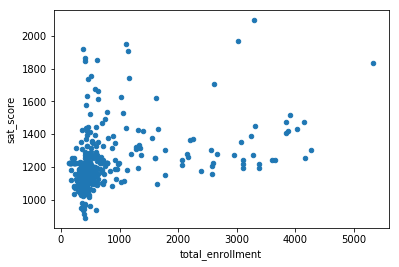

In [102]:
%matplotlib inline

full.plot.scatter(x='total_enrollment', y='sat_score')

In the above chart, we can see that low enrollment in schools leads to low sat_scores. Below, we can get a list of the schools which have low enrollments and low sat_scores.

In [103]:
full[(full["total_enrollment"] < 1000) & (full["sat_score"] < 1000)]["School Name"]

34     INTERNATIONAL SCHOOL FOR LIBERAL ARTS
143                                      NaN
148    KINGSBRIDGE INTERNATIONAL HIGH SCHOOL
203                MULTICULTURAL HIGH SCHOOL
294      INTERNATIONAL COMMUNITY HIGH SCHOOL
304          BRONX INTERNATIONAL HIGH SCHOOL
314                                      NaN
317            HIGH SCHOOL OF WORLD CULTURES
320       BROOKLYN INTERNATIONAL HIGH SCHOOL
329    INTERNATIONAL HIGH SCHOOL AT PROSPECT
331               IT TAKES A VILLAGE ACADEMY
351    PAN AMERICAN INTERNATIONAL HIGH SCHOO
Name: School Name, dtype: object

By checking online, we can find out that these schools are for students who are learning English and hence have low enrollment. This implies that the low Total SAT Score is correlated to students who are learning English and is not related to low enrollment.

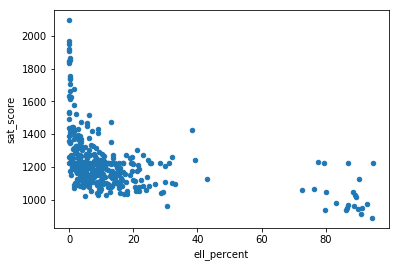

In [104]:
full.plot.scatter(x='ell_percent', y='sat_score')

We know that the percentage of English learners is correlated with low SAT scores. From the above scatter plot, we can also see that there is also a group of schools which have high ell_percent and still have low SAT score. We can make a district map of these schools. We can see from the previous and below district maps that districts with low percent of English learners tend to have higher SAT scores.

In [121]:
show_district_map("ell_percent")

We can also correlate the SAT scores to the survey data. Number of parents and number of students that responded seem to highly correlate with higher SAT scores. saf_tot_11 is a measure of whether students feel safe in the school. It is natural that if students feel safer, they feel more comfortable and hence the SAT scores are higher. Other factors such as communication, academic engagement don't seem to matter that much. 

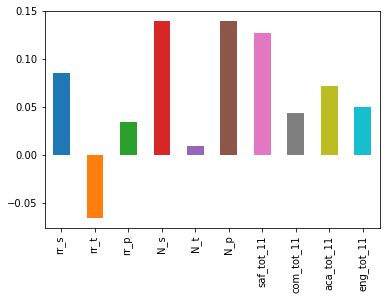

In [106]:
full.corr()["sat_score"][["rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_tot_11", "com_tot_11", "aca_tot_11", "eng_tot_11"]].plot.bar()

Correlating race with SAT scores, we can see that the schools with higher white and asian percentage students score higher in SAT than higher black or hispanic percentage students. We can also map the hispanic percentage and check with the SAT score district map.

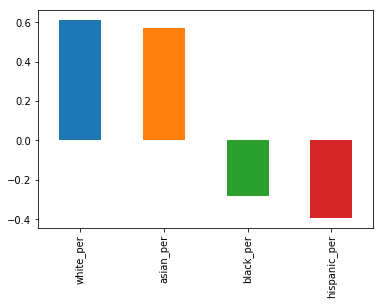

In [149]:
full.corr()["sat_score"][["white_per", "asian_per", "black_per", "hispanic_per"]].plot.bar()

In [122]:
show_district_map("hispanic_per")

It also turns out that there seems to be some correlation with ell_percent and hispanic_per possibly because they are learning English and are recent immigrants.

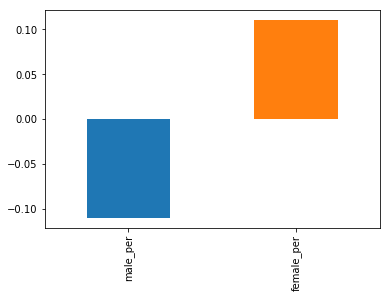

In [109]:
full.corr()["sat_score"][["male_per", "female_per"]].plot.bar()

Correlating gender, we can see that higher male percentages imply lower SAT scores.

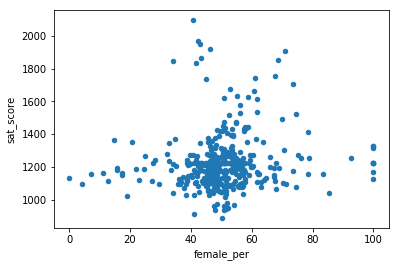

In [110]:
full.plot.scatter(x='female_per', y='sat_score')

We can also get the names of the schools with high SAT scores and high percentage of females.

In [111]:
full[(full["female_per"] > 65) & (full["sat_score"] > 1400)]["School Name"]

3             PROFESSIONAL PERFORMING ARTS HIGH SCH
92                    ELEANOR ROOSEVELT HIGH SCHOOL
100                    TALENT UNLIMITED HIGH SCHOOL
111            FIORELLO H. LAGUARDIA HIGH SCHOOL OF
229                     TOWNSEND HARRIS HIGH SCHOOL
250    FRANK SINATRA SCHOOL OF THE ARTS HIGH SCHOOL
265                  BARD HIGH SCHOOL EARLY COLLEGE
Name: School Name, dtype: object

Checking online, we can find out that these schools focus on arts and is responsible for high SAT scores.

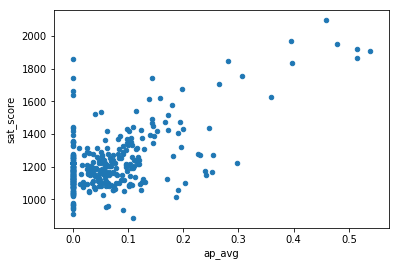

In [112]:
full["ap_avg"] = full["AP Test Takers "] / full["total_enrollment"]

full.plot.scatter(x='ap_avg', y='sat_score')

We can also correlate the SAT scores with AP scores. It seems that there is a high correlation. Schools with smaller proportion of students taking the AP tend to have lower SAT scores and vice-versa. We can get the names of the school with higher proportion of students taking AP and high SAT scores.

In [151]:
full[(full["ap_avg"] > .3) & (full["sat_score"] > 1700)]["School Name"]

92             ELEANOR ROOSEVELT HIGH SCHOOL
98                    STUYVESANT HIGH SCHOOL
157             BRONX HIGH SCHOOL OF SCIENCE
161    HIGH SCHOOL OF AMERICAN STUDIES AT LE
176           BROOKLYN TECHNICAL HIGH SCHOOL
229              TOWNSEND HARRIS HIGH SCHOOL
243    QUEENS HIGH SCHOOL FOR THE SCIENCES A
260      STATEN ISLAND TECHNICAL HIGH SCHOOL
Name: School Name, dtype: object

Searching online, we can see that these schools need an entrance to get in and are highly selective. 